In [201]:
import numpy as np
from analysis import AstrocyteAnalyzer
from analysis import AstrocytePlotter
from importlib import reload  # Python 3.4+ only
AstrocyteAnalyzer = reload(AstrocyteAnalyzer)
AstrocytePlotter = reload(AstrocytePlotter)
import os, sys, glob
import plotly.offline as offline
from preprocessing import analysis_pp
from analysis.general_utils import aqua_utils, saving_utils, plotly_utils, general_utils, compare_astro_utils, correlation_utils, duration_utils, stat_utils
import pandas as pd

analysis_pp = reload(analysis_pp)
aqua_utils = reload(aqua_utils)
plotly_utils = reload(plotly_utils)
saving_utils = reload(saving_utils)
duration_utils = reload(duration_utils)
compare_astro_utils = reload(compare_astro_utils)
correlation_utils = reload(correlation_utils)
stat_utils = reload(stat_utils)

In [148]:
base_path_d_B = '/Users/achilleasgeorgiou/Desktop/data_local/astro_only/m2000219_d190411_c004/'
astro = AstrocyteAnalyzer.AstrocyteAnalyzer(base_path_d_B, day=1, aqua_bound=True)

experiment path /Users/achilleasgeorgiou/Desktop/data_local/astro_only/m2000219_d190411_c004/day_1
save res path /Users/achilleasgeorgiou/Desktop/data_local/astro_only/m2000219_d190411_c004/day_1/aqua_bound/aqua_merged/merged.pkl
Running ind 13426 [1851 1852 1853 1854 1855 1856 1857 1858 1859 1860]
Rest ind 35642 [0 1 2 3 4 5 6 7 8 9]
Running exact ind 8447 [1851 2020 2021 2022 2023 2028 2029 2030 2031 2032]
Rest exact ind 40621 [0 1 2 3 4 5 6 7 8 9]
No stick ind 41996 [0 1 2 3 4 5 6 7 8 9]
Stick ind 7072 [2075 2076 2077 2078 2079 2080 2081 2082 2083 2084]
Stick exact start ind  81 [ 2075  2187  3605  7069  7217  9834 13122 16102 16263 18398]
Stick start ind 1215 [2075 2076 2077 2078 2079 2080 2081 2082 2083 2084]
Stick end ind 1215 [2078 2079 2080 2081 2082 2083 2084 2085 2086 2087]
Stick expect ind 1215 [2060 2061 2062 2063 2064 2065 2066 2067 2068 2069]
Stick rest ind 5167 [34689 34690 34691 34692 34693 34694 34695 34696 34697 34698]
Running exact start ind 159 [1851 2020 2318 2827 

In [ ]:
output_folder = 'output/'
astroP = AstrocytePlotter.AstrocytePlotter(output_folder)

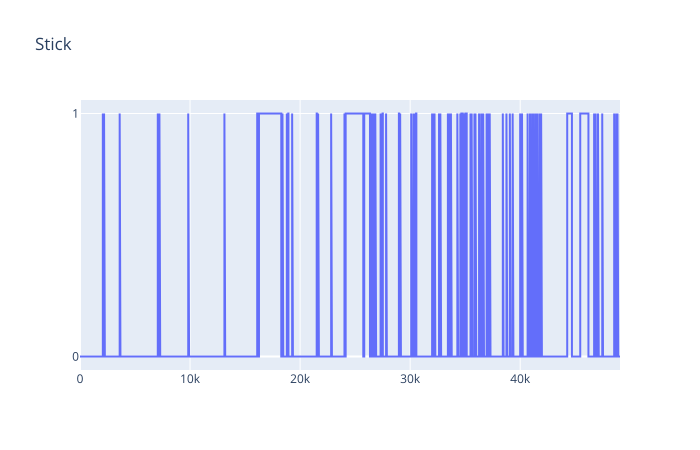

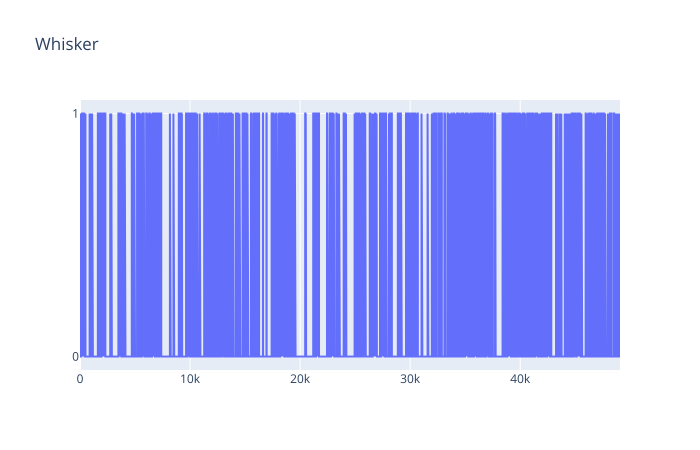

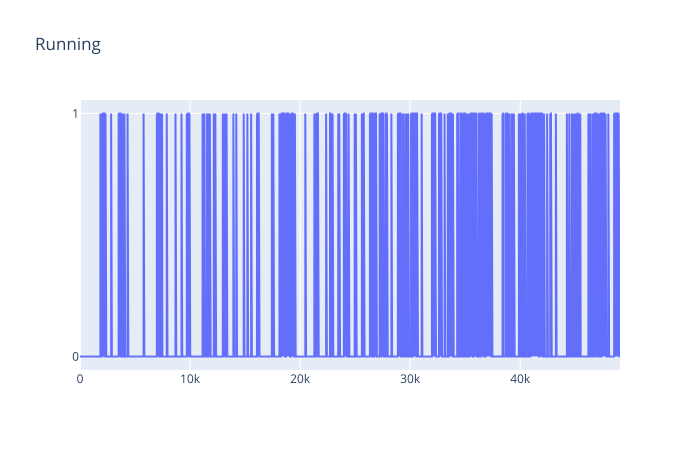

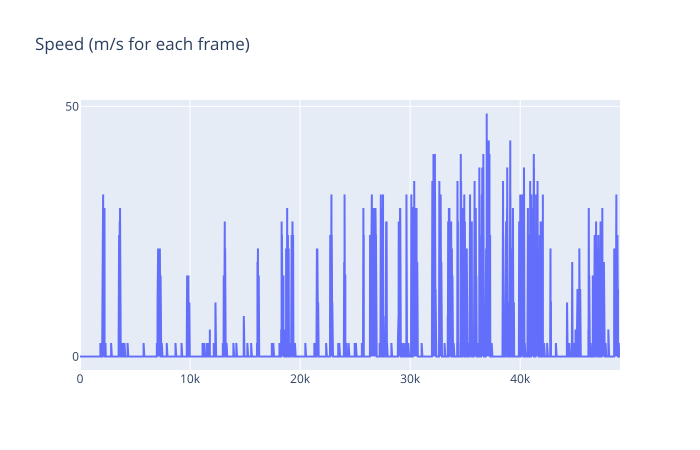

In [150]:
#speed_values
#pupil_values_old

x = np.arange(len(astro.stick_bin))

plotly_utils.plot_scatter_fmt(x, astro.stick_bin, astype='int', title='Stick').show('svg')
plotly_utils.plot_scatter_fmt(x, astro.whisker_bin, astype='int', title='Whisking').show('svg')
plotly_utils.plot_scatter_fmt(x, astro.speed_bin, astype='int', title='Running').show('svg')
plotly_utils.plot_scatter_fmt(x, astro.speed_values, astype='float', title='Speed (m/s for each frame)').show('svg')

### All the information obtained from AQuA is stored in res_d

In [5]:
astro.res_d.keys()

dict_keys(['area', 'circMetric', 'peri', 'decayTau', 'dffMax', 'dffMax2', 'dffMaxFrame', 'dffMaxPval', 'dffMaxZ', 'fall91', 'rgt1', 'rise19', 'tBegin', 'tEnd', 'width11', 'width55', 'areaChange', 'areaChangeRate', 'areaFrame', 'propGrow', 'propGrowOverall', 'propShrink', 'propShrinkOverall', 't0', 't1', 'x2D', 'x3D', 'border_mask', 'clandmark_mask', 'clandmark_center', 'border_dist2border', 'clandmark_distAvg', 'dff_raw', 'dff_only', 'd_raw', 'd_only', 'event_i_video_segment', 'time', 'time_s', 'duration'])

In [46]:
print('Area \n', astro.res_d['area'], '\n')
print('Amplitude \n', astro.res_d['dffMax2'], '\n')
print('Max amplitude frame \n', astro.res_d['dffMaxFrame'], '\n')
print('Begin event frame \n', astro.res_d['tBegin'], '\n') #or t0
print('End event frame \n', astro.res_d['tEnd'], '\n') #or t1
print('Duration (frames) \n', astro.res_d['time'], '\n')
print('Duration (seconds) \n', astro.res_d['time_s'], '\n')
print('Which video segment this belongs to (0 for first .tif file) \n', astro.res_d['event_i_video_segment'], '\n')
print('df/f raw \n', astro.res_d['dff_raw'], '\n')
print('df/f only event \n', astro.res_d['dff_only'], '\n')
print('Spatial footprint of event 0(flattened indices)', astro.res_d['x2D'][0])
print('3D footprint of event 0 (flattened indices)', astro.res_d['x3D'][0])

Area 
 [ 60.50903325  51.28283675 160.51561575 ...   2.0876795    2.25604075
   2.155024  ] 

Amplitude 
 [1.3765903  1.29955566 1.61880286 ... 1.4530365  1.33548112 1.6539668 ] 

Max amplitude frame 
 [ 2082  2085  2089 ... 47091 47642 48855] 

Begin event frame 
 [ 2077  2078  2076 ... 47090 47641 48854] 

End event frame 
 [ 2101  2101  2110 ... 47093 47643 48856] 

Duration (frames) 
 [24 23 34 ...  3  2  2] 

Duration (seconds) 
 [2.328 2.231 3.298 ... 0.291 0.194 0.194] 

Which video segment this belongs to (0 for first .tif file) 
 [ 1.  1.  1. ... 18. 18. 18.] 

df/f raw 
 [[ 0.41404876  0.31910455  0.28465638 ...  0.03656153 -0.00200727
   0.01263372]
 [ 0.5318986   0.47340107  0.4254252  ...  0.01659716  0.01234877
  -0.00947769]
 [ 0.5702285   0.4641006   0.38609758 ...  0.0434259   0.00219257
   0.0114435 ]
 ...
 [ 0.02385513  0.20837273  0.02577027 ...  0.29100087 -0.02009122
   0.15468068]
 [ 0.0421914   0.33709157  0.4084412  ...  0.42562845  0.31742066
  -0.04339489]
 [

### Helpful variables

In [85]:
print('Input shape \n', astro.input_shape, '\n')
print('Framerate \n', astro.fr, '\n')
print('Spatial resolution  \n', astro.spatial_res, '\n')

#print('Paths of inputs')
#print(astro.behaviours_path)
#print(astro.oscilloscope_path)
#print(astro.save_res_path)

Input shape 
 [ 512  512 2726] 

Framerate 
 10.309278350515463 

Spatial resolution  
 0.1835 



In [77]:
print('Indices in frames corresponding to each \'behaviour\' ')
print('{:30}{:>10}'.format('KEY', 'LENGTH'))
print('_________________________________________')
for k in astro.indices_d.keys():
    print('{:30}{:10d}'.format(k, len(astro.indices_d[k])))

Indices in frames corresponding to each 'behaviour' 
KEY                               LENGTH
_________________________________________
default                            49068
rest_exact                         40621
no_stick                           41996
stick                               7072
stick_exact_start                     81
stick_start                         1215
stick_end                           1215
stick_expect                        1215
running                            13426
running_exact                       8447
running_semi_exact                 11041
running_exact_start                  159
running_start                       2326
running_before                      2256
stick_run_ind_15                    1905
stick_run_ind_30                    3120
stick_rest_no_run                   5167
rest                               35642
rest_semi_exact                    38027
rest_start                           160
stick_rest                          5167
whi

In [81]:
print('Event ids corresponding to each \'behaviour\' ')
print('{:30}{:>10}'.format('KEY', 'LENGTH'))
print('_________________________________________')
for k in astro.event_subsets.keys():
    print('{:30}{:10d}'.format(k, len(astro.event_subsets[k])))

Event ids corresponding to each 'behaviour' 
KEY                               LENGTH
_________________________________________
default                             8794
rest_exact                          5959
no_stick                            7556
stick                               1238
stick_exact_start                     23
stick_start                          413
stick_end                            423
stick_expect                         335
running                             4025
running_exact                       2835
running_semi_exact                  3569
running_exact_start                   20
running_start                        362
running_before                       279
stick_run_ind_15                     623
stick_run_ind_30                    1092
stick_rest_no_run                    615
rest                                4769
rest_semi_exact                     5225
rest_start                            35
stick_rest                           615
whisker_exa

In [110]:
print('Ignored bright spot events \n', astro.ignore_events_l, '\n')
# astro.all_durations_d | Duration of events per behaviour dictionary

Ignored bright spot events 
 [] 



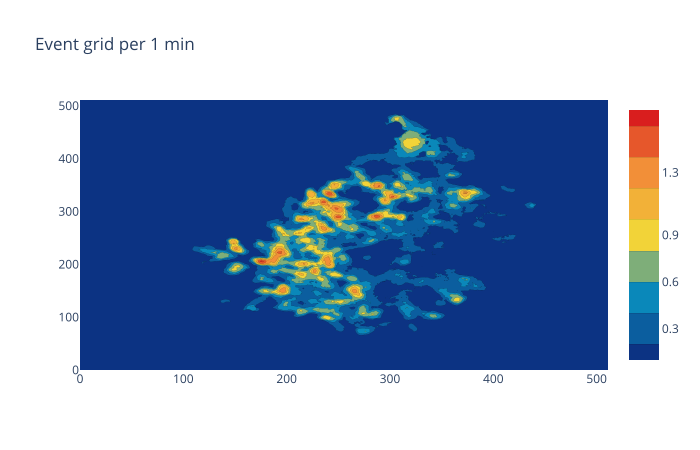

In [109]:
#Change this for 'running', 'rest' or other behaviours
bk = 'default'

plotly_utils.plot_contour(astro.border, title='Border').show('svg')
plotly_utils.plot_contour(astro.event_grids[bk], title='Event grid').show('svg')
plotly_utils.plot_contour(astro.event_grids_dff[bk], title='Event grid (df/f)').show('svg')
fig = plotly_utils.plot_contour(astro.event_grids_1min[bk], title='Event grid per 1 min').show('svg')
fig = plotly_utils.plot_contour(astro.event_grids_1min_dff[bk], title='Event grid per 1 min (df/f)').show('svg')

### Helpful functions and examples

#### Grid of first 100 events

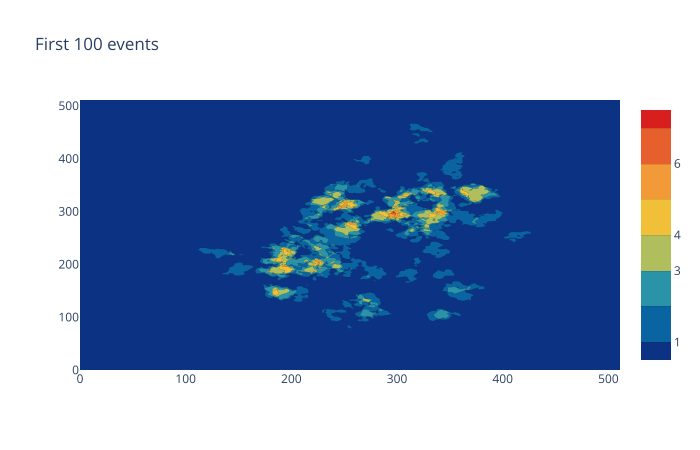

In [153]:
input_shape_2d = (astro.input_shape[0], astro.input_shape[1])

#Obtain grid of first 100 events
grid = aqua_utils.get_event_grid_from_x2D(astro.res_d['x2D'][0:100], input_shape_2d)
plotly_utils.plot_contour(grid, title='First 100 events').show('svg')

#### Get event centroids of first 10 events

In [157]:
event_centroids = aqua_utils.get_event_centroids_from_x2D(astro.res_d['x2D'][0:10], input_shape_2d)
print(event_centroids[0:10])

[(220, 346), (273, 316), (281, 374), (222, 187), (226, 202), (202, 206), (173, 299), (194, 261), (249, 234), (321, 228)]


#### Get all event ids starting at frames 500:550, 3000:3500

In [169]:
indices_subsets = {'default' : astro.indices_d['default'], 'range500' : list(np.arange(500,550)), 'range3000' : list(np.arange(3000, 3500))}
subsets = aqua_utils.get_event_subsets(indices_subsets, astro.res_d, after_i=0, before_i=0)

print('Event ids in frames 500-550', subsets['range500'])
print('Event ids in frames 3000-3500', subsets['range3000'])

Event ids in frames 500-550 [ 63  88 217 227 267 322 342 435 463 530 539 554 637 639 666 716]
Event ids in frames 3000-3500 [ 788  790  794  796  797  823  835  845  857  869  873  874  881  884
  900  901  909  913  915  916  926  931  935  951  963  966  967  973
  974  976  994 1006 1009 1010 1015 1020 1037 1043 1044 1059 1074 1082
 1087 1088 1094 1123 1124 1126 1147 1148 1160 1164 1172 1173 1174 1178
 1187 1224 1236 1245 1263 1268 1269 1274 1277 1278 1282 1286 1290 1306
 1312 1318 1337 1343 1363 1367 1391 1393]


#### Generate fake (running) astrocyte sample given astrocyte event sizes

In [178]:
event_areas = astro.res_d['area'][astro.event_subsets['running']] / (astro.spatial_res**2)
fake_sample = compare_astro_utils.get_fake_astrocyte_sample_from_areas(astro, event_areas, mode='append', filter_ratio=1, return_info=False, border_grid=astro.border)

max pixels: 1167123.0 curr pixels: 1169610


In [179]:
plotly_utils.plot_contour(fake_sample, title='Fake sample').show('svg')

#### Distribution of measures over different behaviours

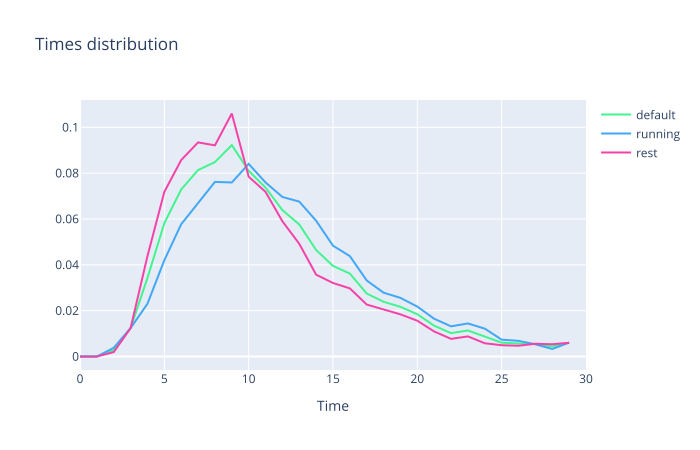

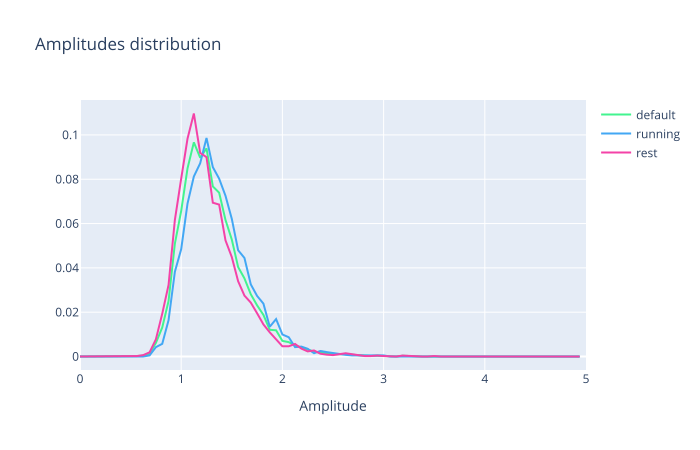

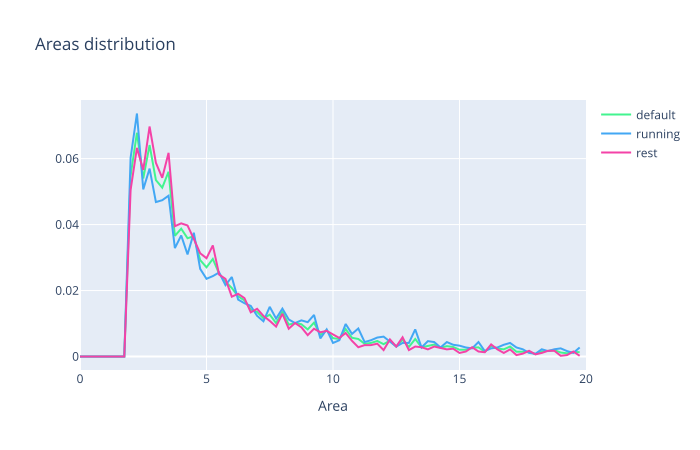

In [224]:
astroP.measure_distribution_bh_compare_plot([astro], ['default', 'running', 'rest'], measure='duration', num_bins=30, min_measure=0, max_measure=30, measure_name='Time', confidence=True)[0].show('svg')
astroP.measure_distribution_bh_compare_plot([astro], ['default', 'running', 'rest'], measure='dffMax2', num_bins=80, min_measure=0, max_measure=5, measure_name='Amplitude', confidence=True)[0].show('svg')
astroP.measure_distribution_bh_compare_plot([astro], ['default', 'running', 'rest'], measure='area', num_bins=80, min_measure=0, max_measure=20, measure_name='Area', confidence=True)[0].show('svg')

#### Plot event signal

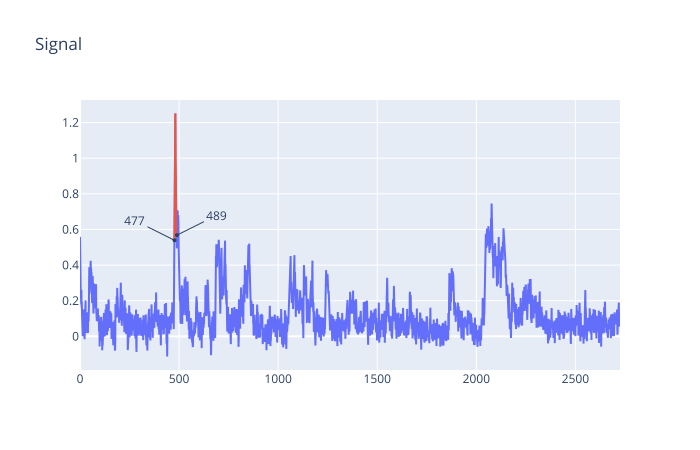

In [231]:
event_id = 123
astroP.get_signal_fig(astro, event_id).show('svg')